In [7]:
import json
import numpy as np

import matplotlib.pyplot as plt

In [8]:
metrics = json.load(open("../data/metrics_overview.json"))

scenes = list(metrics.keys())
print(f"Loaded {len(scenes)} scenes")

Loaded 5 scenes


In [9]:
metrics["0229"][0].keys()

dict_keys(['n_reg_images', 'mean_reprojection_error', 'n_observations', 'mean_obs_per_reg_image', 'mean_track_length', 'n_images', 'perc_reg_images', 'mean_overlap', 'scene', 'model_name', 'retrieval', 'n_retrieval_matches', 'features', 'matcher', 'overlap_fn'])

In [10]:
[m["model_name"] for m in metrics["0229"]]

['sift-NN-ratio-netvlad-50',
 'sift-NN-ratio-poses-20',
 'colmap-exhaustive',
 'colmap-sequential',
 'baseline',
 'sift-NN-ratio-netvlad-50',
 'sift-NN-ratio-netvlad-5',
 'sift-NN-ratio-exhaustive',
 'sift-NN-ratio-netvlad-50',
 'sift-NN-ratio-exhausitve',
 'loftr',
 'superpoint_max-superglue',
 'superpoint_max-superglue-cosplace-50',
 'sift-NN-ratio-cosplace-50']

In [11]:
def plot_metric(metrics, scene):
    keys = [
        "n_reg_images", 
        "perc_reg_images", 
        "mean_reprojection_error", 
        "n_observations", 
        "mean_obs_per_reg_image", 
        "mean_track_length",
        "mean_overlap"
    ]
    
    labels = []
    for m in metrics[scene]:
        if "model_name" in m.keys():
            labels.append(m["model_name"])
        else:
            labels.append(f"{m['features']}-{m['matcher']}")

    fig, ax = plt.subplots(4, 2, figsize=(30, 30))
    colors = ["red", "green", "blue", "orange", "purple", "brown", "pink", "gray", "olive", "cyan"]
    
    ids = np.argsort(labels)
    labels = [labels[i] for i in ids]
    
    for i, metric in enumerate(keys):
        values = [m[metric] for m in metrics[scene]]

        values = [values[i] for i in ids]

        ax[i // 2, i % 2].bar(labels, values)

        
        # rotate labels
        for tick in ax[i // 2, i % 2].get_xticklabels():
            tick.set_rotation(10)
        
        ax[i // 2, i % 2].set_title(metric)
        
    
    plt.suptitle(f"Scene {scene}-sparse")
    plt.show()

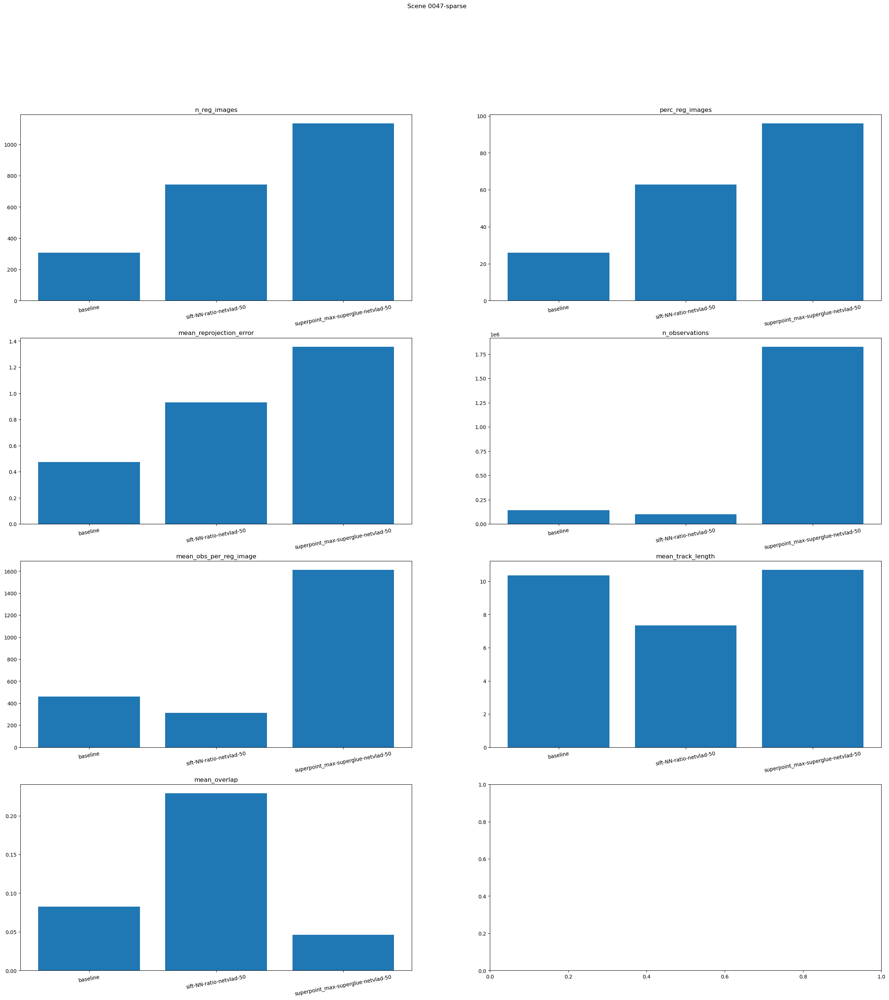

In [12]:
scene = "0047"
plot_metric(metrics, scene)

# Visualize Results

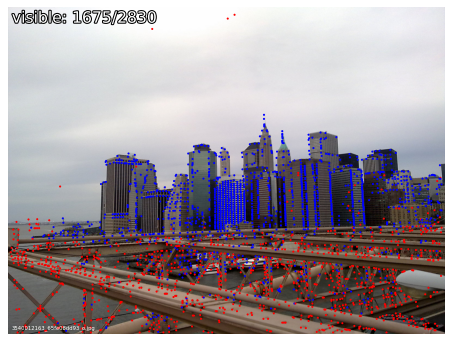

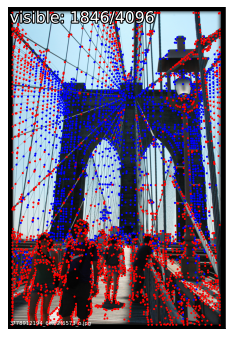

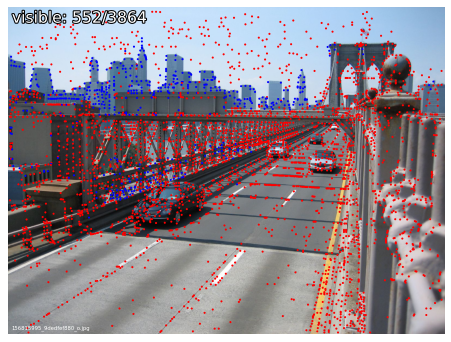

In [14]:
import os
from pathlib import Path

import pycolmap
from hloc import visualization

model = pycolmap.Reconstruction(Path(os.path.join("../data", scene, "sparse", "superpoint_max-superglue-netvlad-50")))
images = Path(os.path.join("../data", scene, "images"))

visualization.visualize_sfm_2d(model, images, color_by='visibility', n=3)

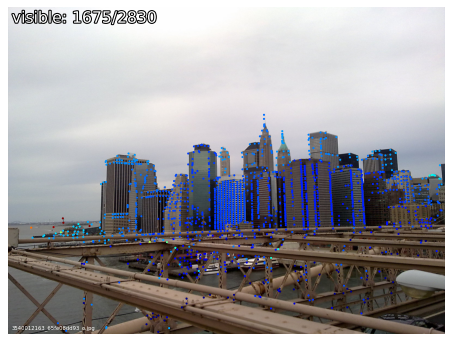

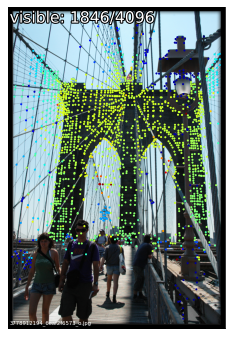

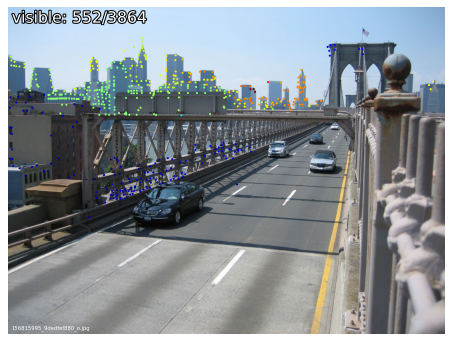

In [15]:
visualization.visualize_sfm_2d(model, images, color_by='depth', n=3)

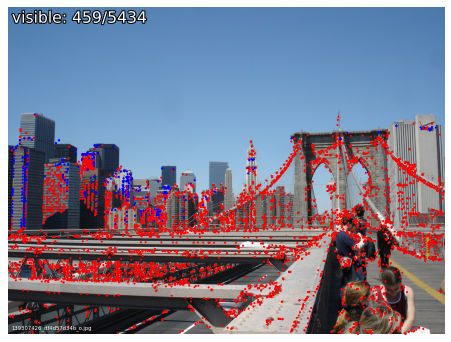

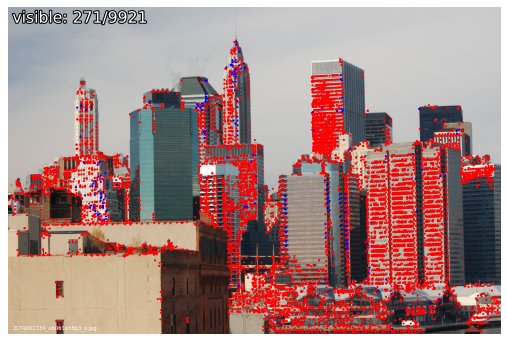

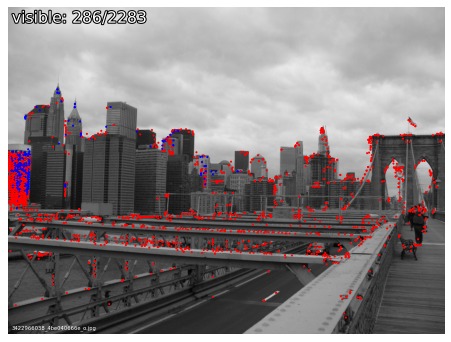

In [16]:
model = pycolmap.Reconstruction(Path(os.path.join("../data", scene, "sparse", "baseline")))
images = Path(os.path.join("../data", scene, "images"))

visualization.visualize_sfm_2d(model, images, color_by='visibility', n=3)

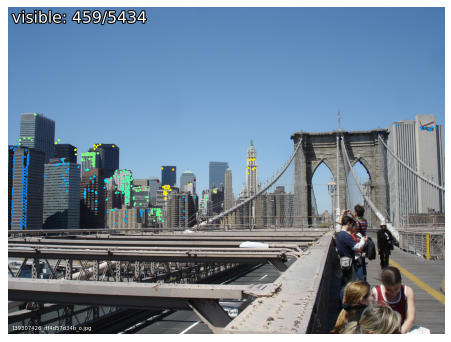

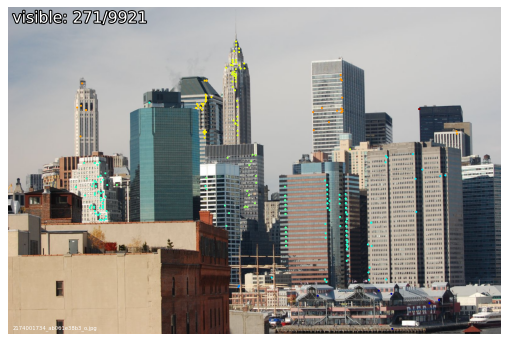

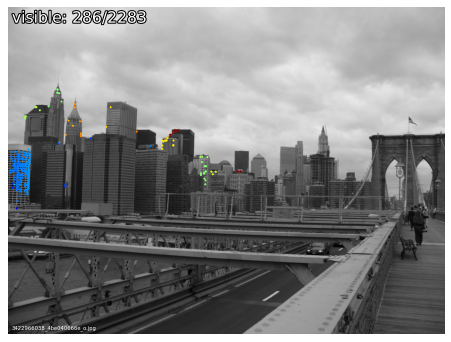

In [17]:
visualization.visualize_sfm_2d(model, images, color_by='depth', n=3)

# Show Unregistered Images

In [18]:
super_model = pycolmap.Reconstruction(Path(os.path.join("../data", scene, "sparse", "superpoint_max-superglue-netvlad-50")))
base_model = pycolmap.Reconstruction(Path(os.path.join("../data", scene, "sparse", "baseline")))

In [19]:
images = os.listdir(os.path.join("../data", scene, "images"))
print(f"Scene {scene} has {len(images)} images")

Scene 0047 has 1183 images


In [20]:
images_supermodel = [i.name for i in super_model.images.values()]
images_basemodel = [i.name for i in base_model.images.values()]

print(f"Superpoint model has {len(images_supermodel)} images")
print(f"Baseline model has {len(images_basemodel)} images")

Superpoint model has 1134 images
Baseline model has 306 images


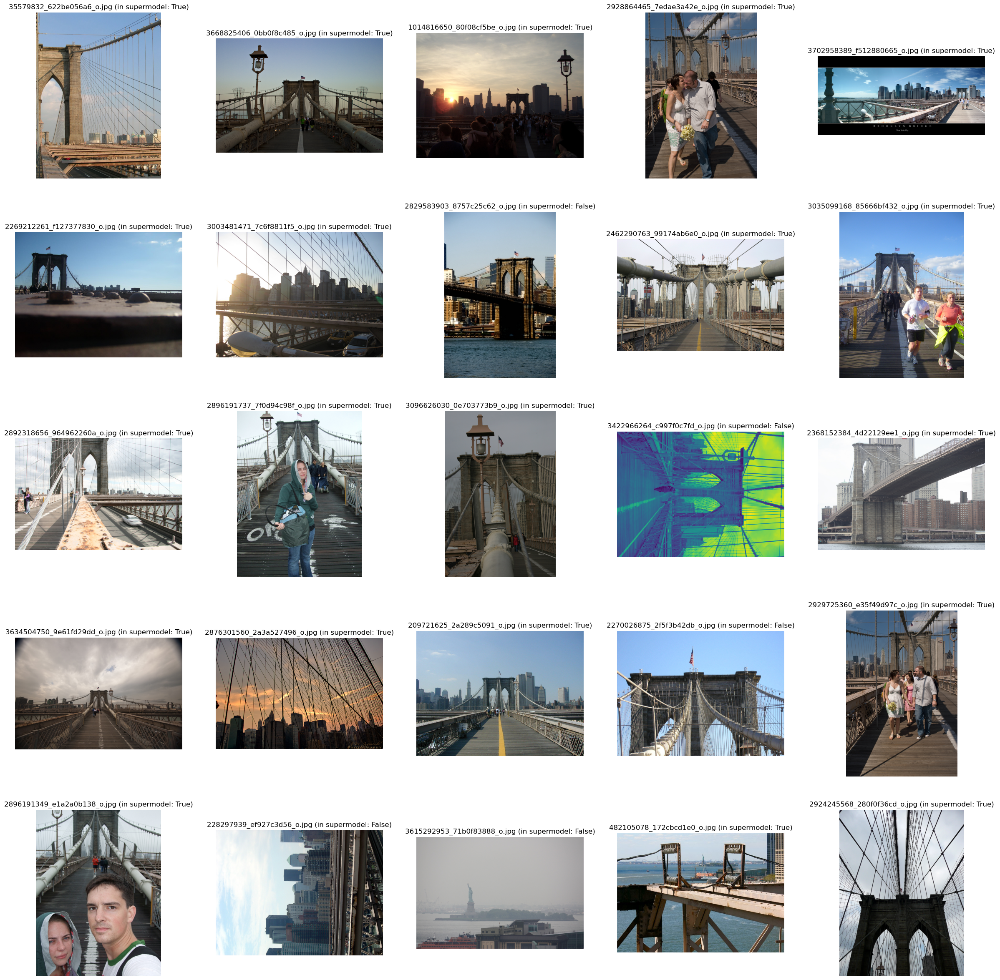

In [21]:
# get 25 random images that are not in the baseline model
unregistered_images = np.random.choice([i for i in images if i not in images_basemodel], 25)

fig, ax = plt.subplots(5, 5, figsize=(30, 30))
for i, image in enumerate(unregistered_images):
    ax[i // 5, i % 5].imshow(plt.imread(os.path.join("../data", scene, "images", image)))
    in_supermodel = image in images_supermodel
    ax[i // 5, i % 5].set_title(f"{image} (in supermodel: {in_supermodel})")
    ax[i // 5, i % 5].axis("off")

plt.show()

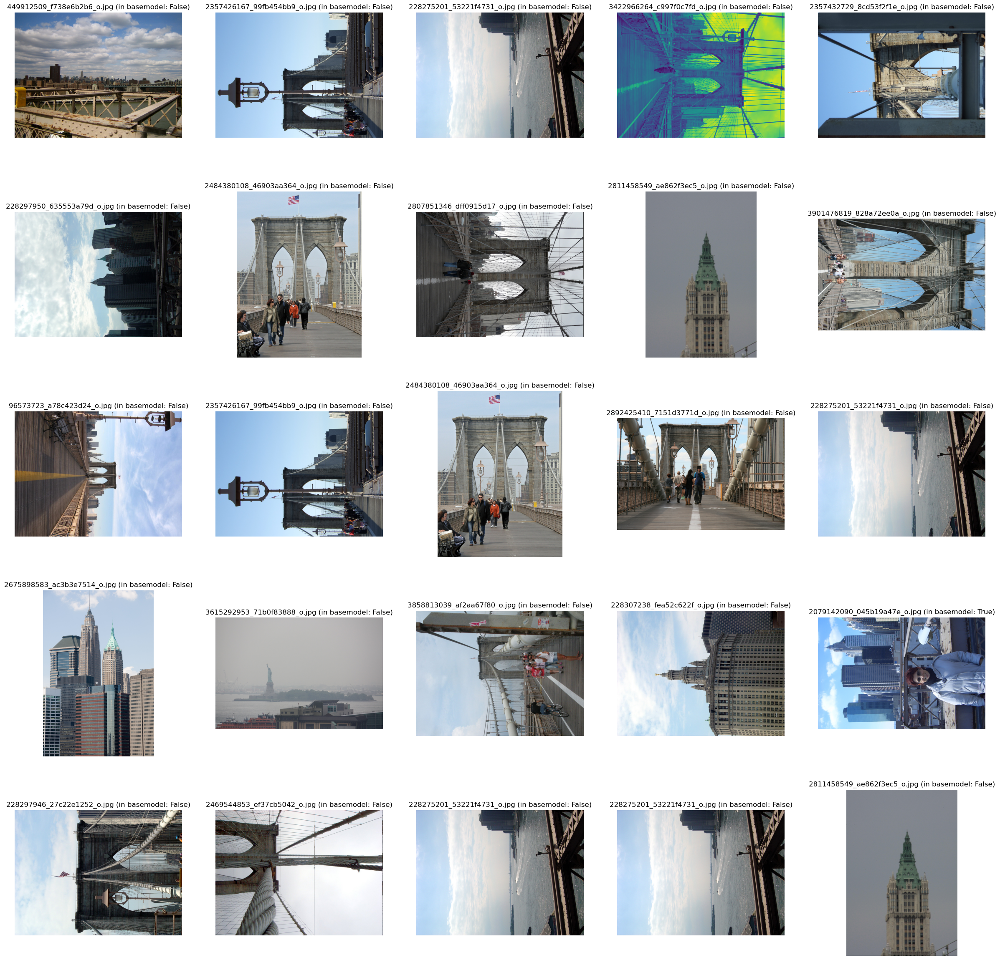

In [22]:
# get 25 random images that are not in the superpoint model
unregistered_images = np.random.choice([i for i in images if i not in images_supermodel], 25)

fig, ax = plt.subplots(5, 5, figsize=(30, 30))
for i, image in enumerate(unregistered_images):
    ax[i // 5, i % 5].imshow(plt.imread(os.path.join("../data", scene, "images", image)))
    in_basemodel = image in images_basemodel
    ax[i // 5, i % 5].set_title(f"{image} (in basemodel: {in_basemodel})")
    ax[i // 5, i % 5].axis("off")

plt.show()

In [24]:
from megadepth.metrics.overlap import sparse_overlap
base_sparse_overlap_matrix = sparse_overlap(base_model)
super_sparse_overlap_matrix = sparse_overlap(super_model)

100%|██████████| 1134/1134 [00:14<00:00, 79.14it/s] 


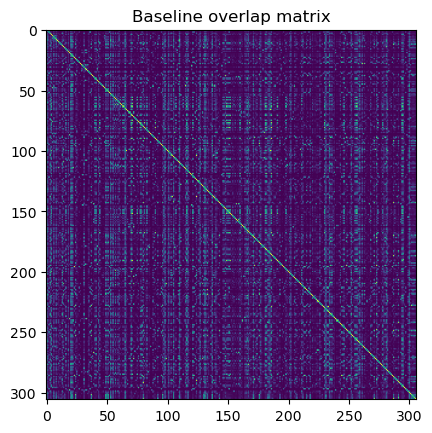

In [27]:
plt.imshow(base_sparse_overlap_matrix)
plt.title("Baseline overlap matrix")
plt.show()

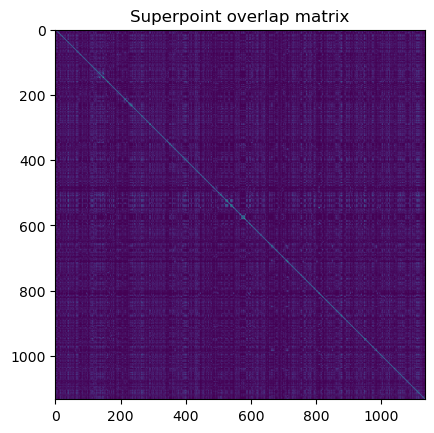

In [28]:
plt.imshow(super_sparse_overlap_matrix)
plt.title("Superpoint overlap matrix")
plt.show()